In [1]:
from google.colab import files
files.upload()

Saving querry.jpg to querry.jpg
Saving dataBase-20201028T153957Z-001.zip to dataBase-20201028T153957Z-001.zip


{'dataBase-20201028T153957Z-001.zip': b'PK\x03\x04\x14\x00\x08\x08\x08\x00\x89\x05\xefP\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x17\x00dataBase/6.jpgup\x13\x00\x01%\xdf`*dataBase/6.jpg\x00\x00\x80\xff\x7f\xff\xd8\xff\xe1\x07\xccExif\x00\x00MM\x00*\x00\x00\x00\x08\x00\x07\x01\x12\x00\x03\x00\x00\x00\x01\x00\x01\x00\x00\x01\x1a\x00\x05\x00\x00\x00\x01\x00\x00\x00b\x01\x1b\x00\x05\x00\x00\x00\x01\x00\x00\x00j\x01(\x00\x03\x00\x00\x00\x01\x00\x02\x00\x00\x011\x00\x02\x00\x00\x00\x1e\x00\x00\x00r\x012\x00\x02\x00\x00\x00\x14\x00\x00\x00\x90\x87i\x00\x04\x00\x00\x00\x01\x00\x00\x00\xa4\x00\x00\x00\xd0\x00\n\xfc\x80\x00\x00\'\x10\x00\n\xfc\x80\x00\x00\'\x10Adobe Photoshop CS6 (Windows)\x002020:07:15 13:14:16\x00\x00\x03\xa0\x01\x00\x03\x00\x00\x00\x01\xff\xff\x00\x00\xa0\x02\x00\x04\x00\x00\x00\x01\x00\x00\x11\x80\xa0\x03\x00\x04\x00\x00\x00\x01\x00\x00\x1a@\x00\x00\x00\x00\x00\x00\x00\x06\x01\x03\x00\x03\x00\x00\x00\x01\x00\x06\x00\x00\x01\x1a\x00\x05\x00\x00\x00\x01\x00\x00\

In [5]:
!unzip dataBase-20201028T153957Z-001.zip

Archive:  dataBase-20201028T153957Z-001.zip
  inflating: dataBase/6.jpg          
  inflating: dataBase/1.jpg          
  inflating: dataBase/3.jpg          
  inflating: dataBase/2.jpg          
  inflating: dataBase/10.jpg         
  inflating: dataBase/7.jpg          
  inflating: dataBase/4.jpg          
  inflating: dataBase/11.jpg         
  inflating: dataBase/12.jpg         
  inflating: dataBase/14.jpg         
  inflating: dataBase/13.jpg         
  inflating: dataBase/5.jpg          


In [6]:
!ls

dataBase  dataBase-20201028T153957Z-001.zip  querry.jpg  sample_data


In [7]:
import numpy as np
import pandas as pd 
import os

In [8]:
###########################################################################
#   Notes:  I recently tackled such problem in a hackerearth deep learning #
# competition and am i sending you a modified version of that notebook     #
# The approach that i am using is Transerfer learning.                     #
# I am using Resnet50 without its head hence it can give me the features i #
# want upon this i can apply  kmeans / algomerative clusttering   with     #
# centres equals to the images present in the directory                    #
# after that its just a prediction to make                                 #
############################################################################         

In [9]:
##################### Making Essential Imports ############################
import sklearn
import os
import sys
import matplotlib.pyplot as plt
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf

In [47]:
#####################################
# Defining a skeleton for our       #
# DataFrame                         #
#####################################

DataFrame = {
    'photo_name' : [],
    'flattenPhoto' : [],
    }

In [48]:
#######################################################################################
#      The Approach is to apply transfer learning hence using Resnet50 as my          #
#      pretrained model                                                               #
#######################################################################################

MyModel = tf.keras.models.Sequential()
MyModel.add(tf.keras.applications.ResNet50(
    include_top = False, weights='imagenet',    pooling='avg',
))

In [49]:
# freezing weights for 1st layer
MyModel.layers[0].trainable = False

In [50]:
### Now defining dataloading Function
def LoadDataAndDoEssentials(path, h, w, returnVector):
    img = cv2.imread(path)
    img = cv2.resize(img, (h, w))
    ## Expanding image dims so this represents 1 sample
    img = img = np.expand_dims(img, 0)
    
    img = tf.keras.applications.resnet50.preprocess_input(img)
    extractedFeatures = MyModel.predict(img)
    extractedFeatures = np.array(extractedFeatures)

    if returnVector == False:
      DataFrame['flattenPhoto'].append(extractedFeatures.flatten())
    else:
      return extractedFeatures.flatten()
    

In [51]:
### with this all done lets write the iterrrative loop
def ReadAndStoreMyImages(path):
    list_ = os.listdir(path)

    for mem in list_:
        DataFrame['photo_name'].append(mem)
        imagePath = path + '/' + mem
        LoadDataAndDoEssentials(imagePath, 224, 224, False)

In [52]:
### lets give the address of our Parent directory and start
path = './dataBase'
ReadAndStoreMyImages(path)

In [53]:
######################################################
#        lets now do clustering                      #
######################################################

Training_Feature_vector = np.array(DataFrame['flattenPhoto'], dtype = 'float64')
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters = len(os.listdir(path)) )
kmeans.fit(Training_Feature_vector)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=12, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [54]:
predictions = kmeans.labels_


In [55]:
i = 0 
for mem in DataFrame['photo_name']:
  print ("Image Name: " + str(mem) + " Cluster centre: " + str(predictions[i]))
  i += 1


Image Name: 6.jpg Cluster centre: 1
Image Name: 4.jpg Cluster centre: 2
Image Name: 7.jpg Cluster centre: 4
Image Name: 2.jpg Cluster centre: 7
Image Name: 11.jpg Cluster centre: 11
Image Name: 12.jpg Cluster centre: 0
Image Name: 5.jpg Cluster centre: 5
Image Name: 14.jpg Cluster centre: 3
Image Name: 1.jpg Cluster centre: 6
Image Name: 10.jpg Cluster centre: 8
Image Name: 13.jpg Cluster centre: 9
Image Name: 3.jpg Cluster centre: 10


In [56]:
## let us now see which image is most familiar to query image
queryVector = LoadDataAndDoEssentials('querry.jpg', 224, 224, True)
kmeans.predict([queryVector])

array([3], dtype=int32)

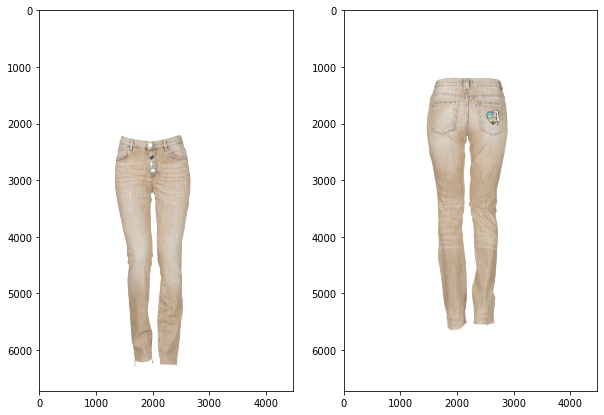

In [57]:
## hence the from above cluster given querry is most similar to image-14
myAnswerImage = cv2.imread('dataBase/14.jpg')
querryImage = cv2.imread('querry.jpg')

import matplotlib.pyplot as plt
plt.figure(figsize =  (10, 10))

plt.subplot(1, 2, 1)
plt.imshow(querryImage)

plt.subplot(1,2, 2)
plt.imshow(myAnswerImage)
